In [1]:
# mounting the drive to get the dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# importing libraries
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

import warnings
warnings.filterwarnings("ignore")

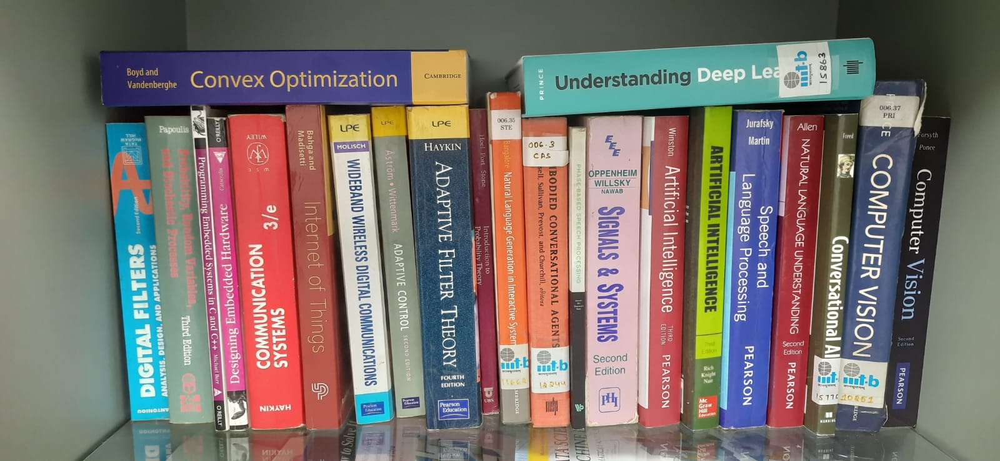

In [3]:
# getting the dataset(csv file) and converting into pandas dataframe
path_link = "/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/BookCount_1.jpeg"

# LOAD AN IMAGE USING 'IMREAD'
img = cv.imread(path_link)

cv2_imshow(img)

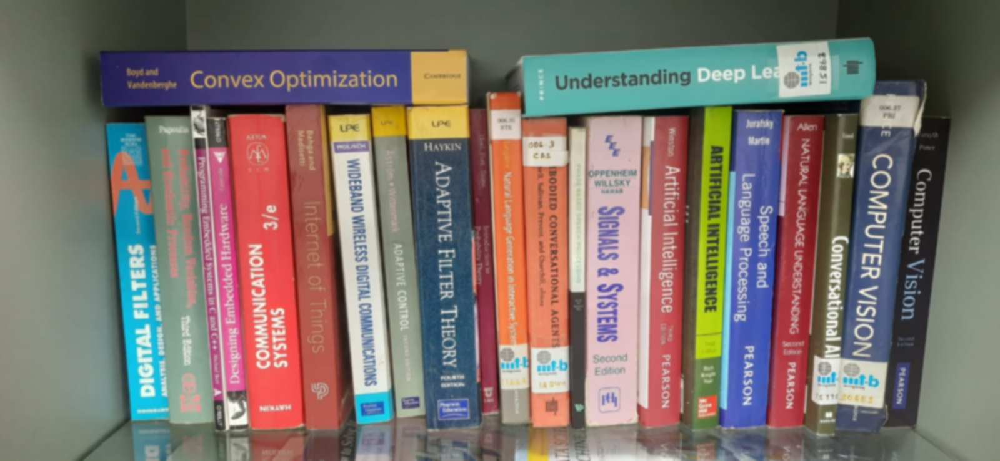

In [4]:
# Blur image with Gaussian Blurring method
blur_img = cv.GaussianBlur(img,(7,7),0)

cv2_imshow(blur_img)

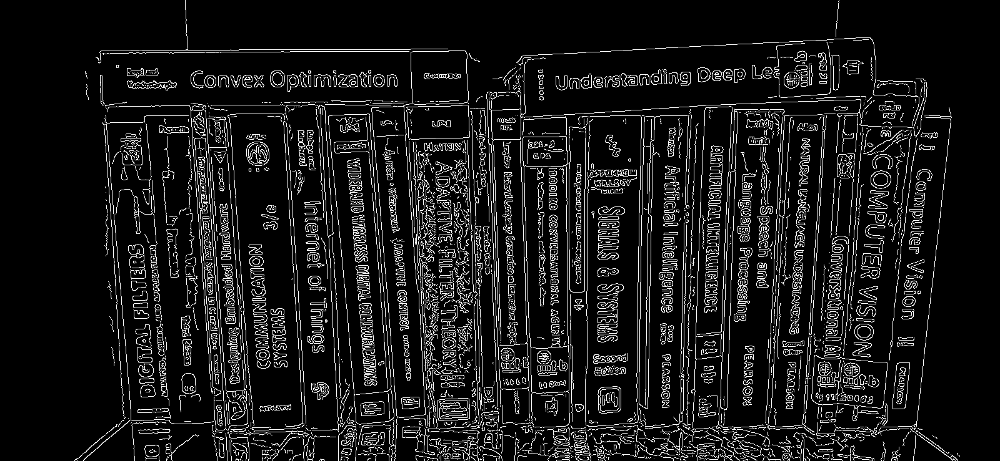

In [5]:
# convert the image to grayscale
gray_canny = cv.cvtColor(blur_img, cv.COLOR_BGR2GRAY)

# Applying Canny edge detection method on gray-scale image
edged= cv.Canny(gray_canny,30,5)

cv2_imshow(edged)

In [6]:
!pip install keras-ocr

Looking for /root/.keras-ocr/craft_mlt_25k.h5


Instructions for updating:
Use `tf.image.resize(...method=ResizeMethod.BILINEAR...)` instead.


Looking for /root/.keras-ocr/crnn_kurapan.h5
6/6 [==============================] - 41s 6s/step


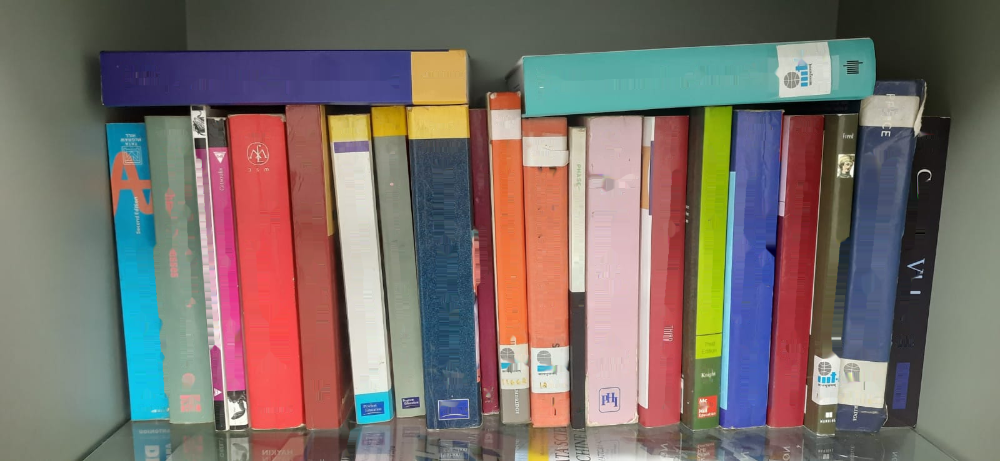

In [7]:
import matplotlib.pyplot as plt
import keras_ocr
import cv2
import math
import numpy as np

def midpoint(x1, y1, x2, y2):
    x_mid = int((x1 + x2)/2)
    y_mid = int((y1 + y2)/2)
    return (x_mid, y_mid)

pipeline = keras_ocr.pipeline.Pipeline()

# # Global variable to store the modified image
# global modified_image

def inpaint_text(img_path, pipeline):
    # global modified_image

    # read image
    img = keras_ocr.tools.read(img_path)
    # generate (word, box) tuples
    prediction_groups = pipeline.recognize([img])
    mask = np.zeros(img.shape[:2], dtype="uint8")

    for _, box in prediction_groups[0]:
        box = np.array(box, dtype=np.int32)
        cv2.fillPoly(mask, [box], 255)

    img = cv2.inpaint(img, mask, 1, cv2.INPAINT_NS)
    modified_image = img  # Store the modified image in the global variable

    modified_image = cv2.cvtColor(modified_image, cv2.COLOR_BGR2RGB)
    return modified_image

# Example usage
modified_image = inpaint_text(path_link, pipeline)
cv2_imshow(modified_image)

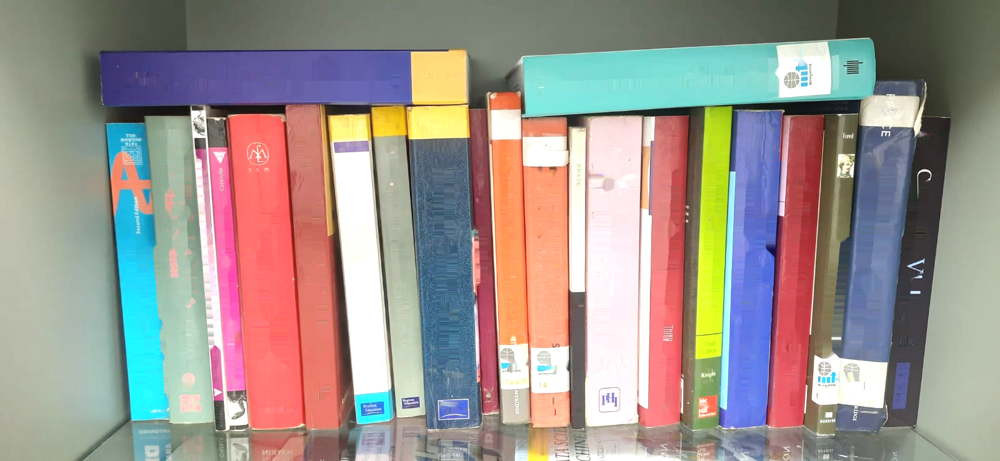

In [8]:
image_new = modified_image.copy()
# Adjusts the brightness by adding 10 to each pixel value
brightness = 15
# Adjusts the contrast by scaling the pixel values by 2.3
contrast = 1.2
image_new = cv2.addWeighted(image_new, contrast, np.zeros(image_new.shape, image_new.dtype), 0, brightness)
cv2_imshow(image_new)

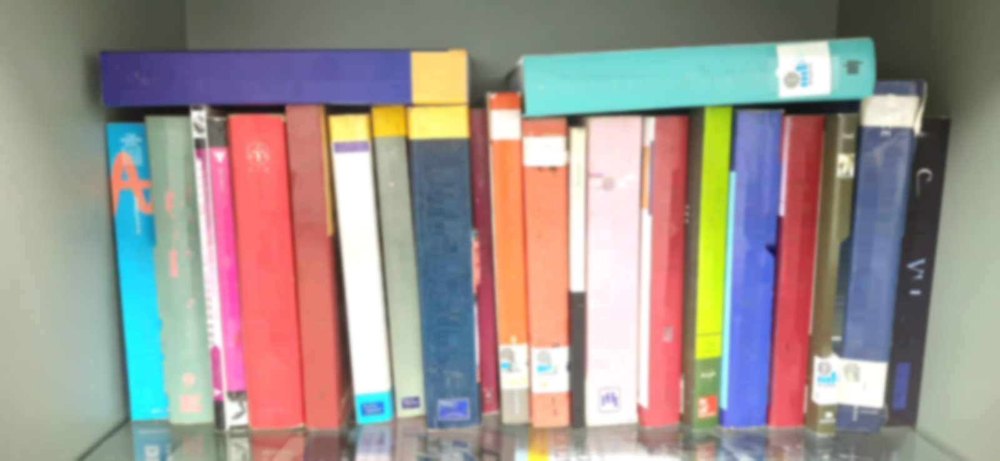

In [9]:
# Blur image with Gaussian Blurring method
blur_img_new = cv.GaussianBlur(image_new,(15,15),0)

cv2_imshow(blur_img_new)

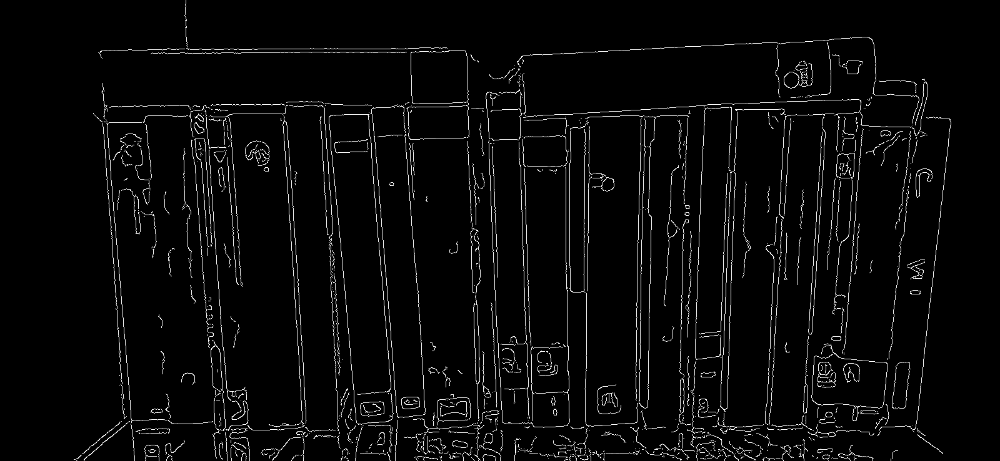

In [10]:
# convert the image to grayscale
gray_canny = cv.cvtColor(blur_img_new, cv.COLOR_BGR2GRAY)


# Applying Canny edge detection method on gray-scale image
edged= cv.Canny(gray_canny,35,5)

cv2_imshow(edged)

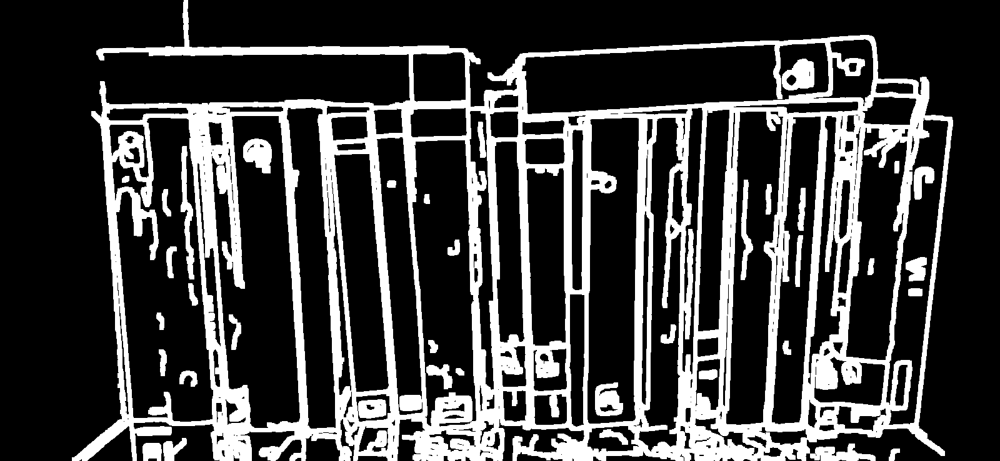

In [11]:
kernel = np.ones((7, 7), np.uint8)

img_dilation = cv2.dilate(edged, kernel, iterations=1)
cv2_imshow(img_dilation)

In [12]:
!pip install rembg

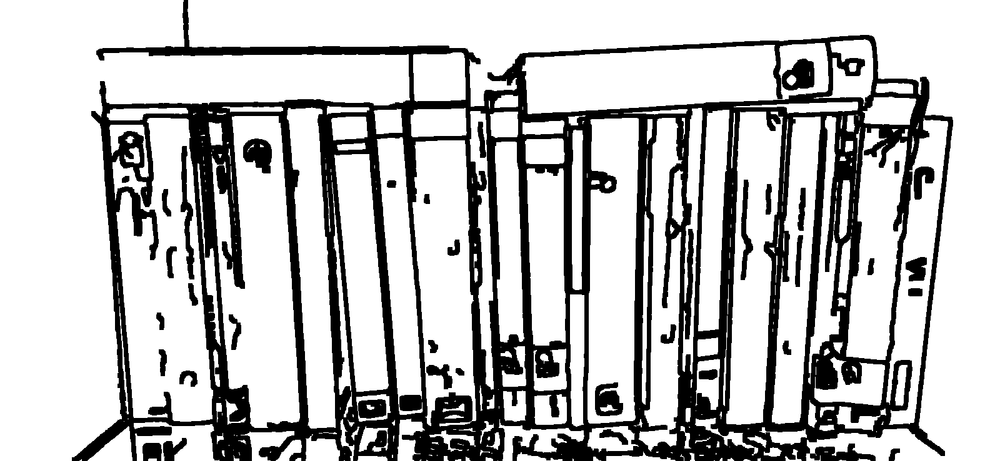

In [13]:
# get the shape of the image
height, width = img_dilation.shape[0], img_dilation.shape[1]

reverted_img = img_dilation.copy()

# Converting all pixels greater than zero to black while black becomes white
for i in range(height):
    for j in range(width):
        if reverted_img[i, j].sum() == 0:
            reverted_img[i, j] = 255
        else:
            reverted_img[i, j] = 0

cv2_imshow(reverted_img)

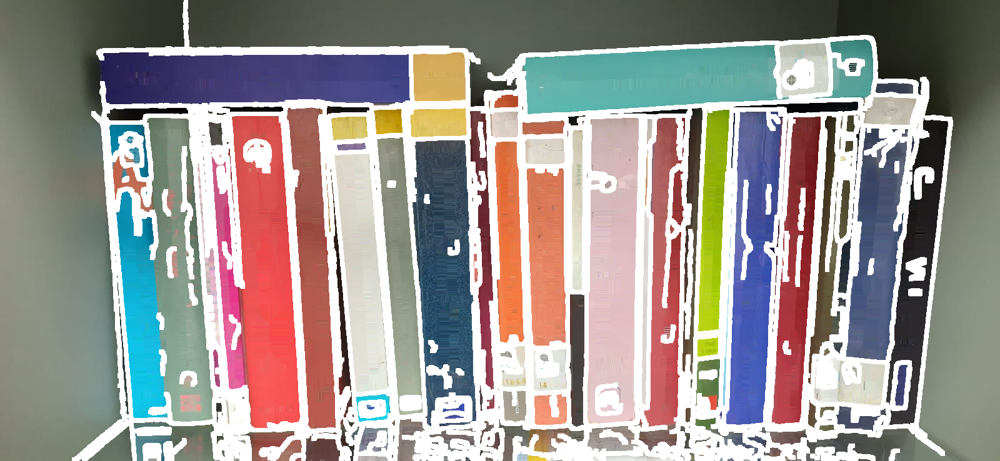

In [14]:
# get the shape of the image
height, width = img_dilation.shape[0], img_dilation.shape[1]

reverted_img = img_dilation.copy()
background_image = modified_image.copy()
# Converting all pixels greater than zero to black while black becomes white
for i in range(height):
    for j in range(width):
        if reverted_img[i, j].sum() == 0:
            background_image[i, j] = modified_image[i,j]
        else:
            background_image[i, j] = reverted_img[i, j]

cv2_imshow(background_image)

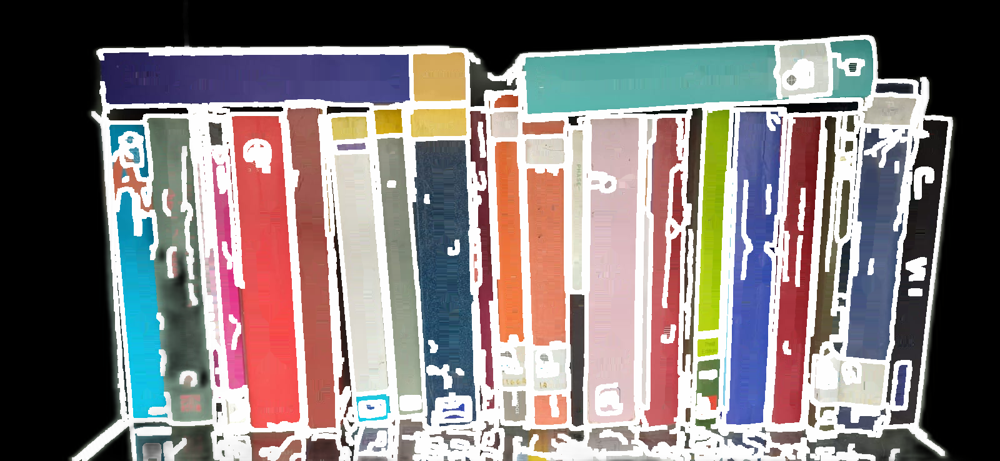

In [15]:
import rembg
from PIL import Image

# Convert the input image to a numpy array
input_array = np.array(background_image)

# Apply background removal using rembg
output_array = rembg.remove(input_array)

# Create a PIL Image from the output array
output_image = Image.fromarray(output_array)

# Convert the PIL image to a NumPy array
numpy_image = np.array(output_image)

# If the image is in RGBA format (contains an alpha channel), convert it to RGB
if numpy_image.shape[-1] == 4:
    numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGBA2RGB)
cv2_imshow(numpy_image)

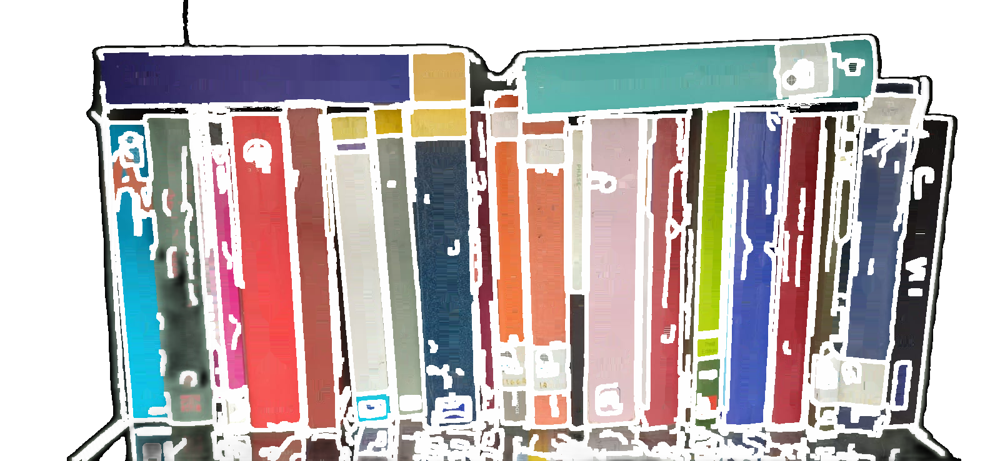

In [16]:
# get the shape of the image
height, width = numpy_image.shape[0], numpy_image.shape[1]

rmbg_img = numpy_image.copy()

# Converting all pixels greater than zero to black while black becomes white
for i in range(height):
    for j in range(width):
        if rmbg_img[i, j].sum() <= 10:
            rmbg_img[i, j] = [255, 255, 255]
        # else:
        #     rmbg_img[i, j] = [255, 255, 255]

cv2_imshow(rmbg_img)

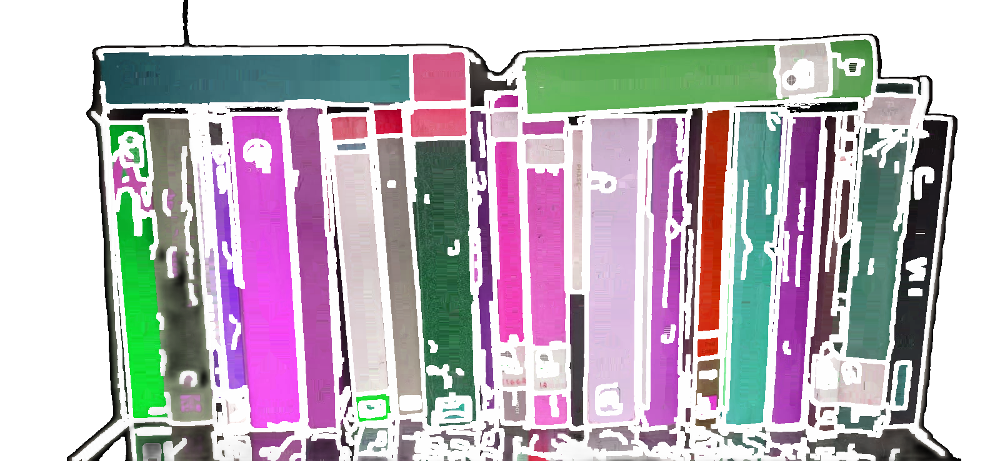

In [17]:
# Convert BGR to HSV
saturation_increased_image = cv2.cvtColor(rmbg_img, cv2.COLOR_RGB2BGR)
hsv_image = cv2.cvtColor(saturation_increased_image, cv2.COLOR_BGR2HSV)

# Change the hue value (e.g., shift by 30 degrees)
hue_shift = 30
hsv_image[:, :, 0] = (hsv_image[:, :, 0] + hue_shift) % 180

# Convert HSV back to BGR
result_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)
result_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)

cv2_imshow(result_image)

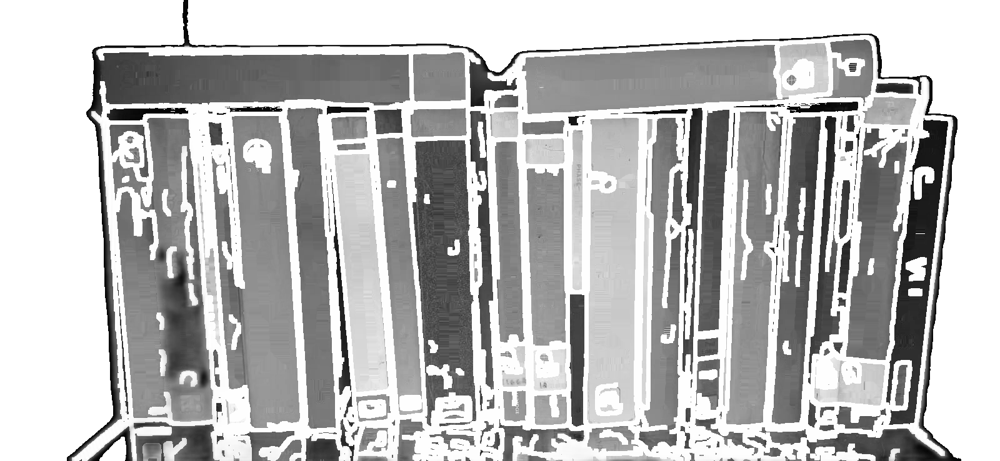

In [18]:
# convert the image to grayscale
# gray_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
gray_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

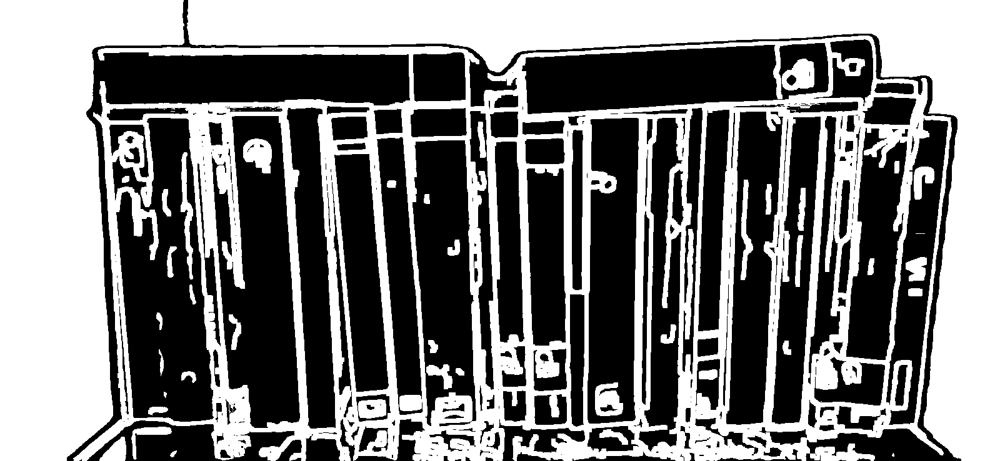

In [19]:
# apply thresholding on the gray image to create a binary image
ret, thresh = cv.threshold(gray_image, 240,255,0)
# ret, thresh = cv.threshold(gray_image, 115,255,0)

cv2_imshow(thresh)

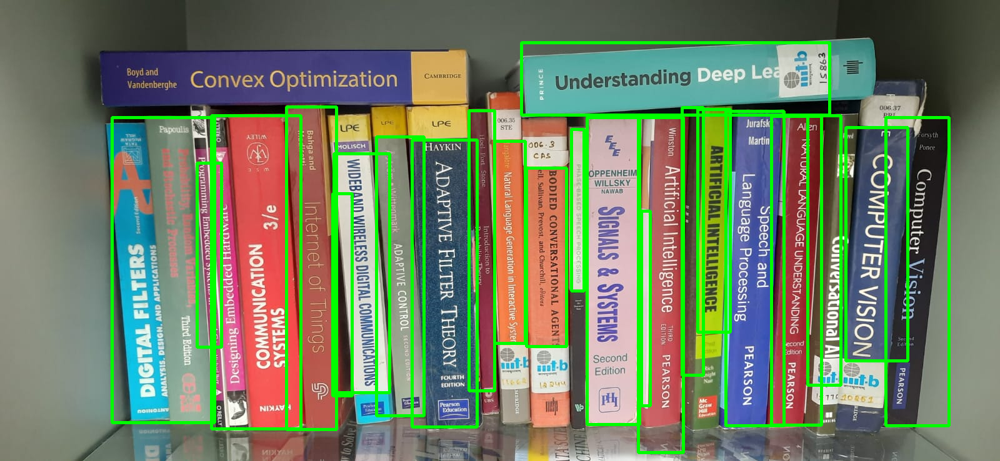

In [20]:
height, width, channels = img.shape

# find the contours
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img_bounding_box_initial = img.copy()
for i in range(len(contours)):
    cnt = contours[i]

    x,y,w,h = cv.boundingRect(cnt)
    # print(x,y,w,h)

    # draw the bounding rectangle
    peri = 2*(w+h)
    if(peri>550 and peri<2000):
        img_bounding_box_initial = cv.rectangle(img_bounding_box_initial, (x,y),(x+w,y+h),(0,255,0),3)

cv2_imshow(img_bounding_box_initial)

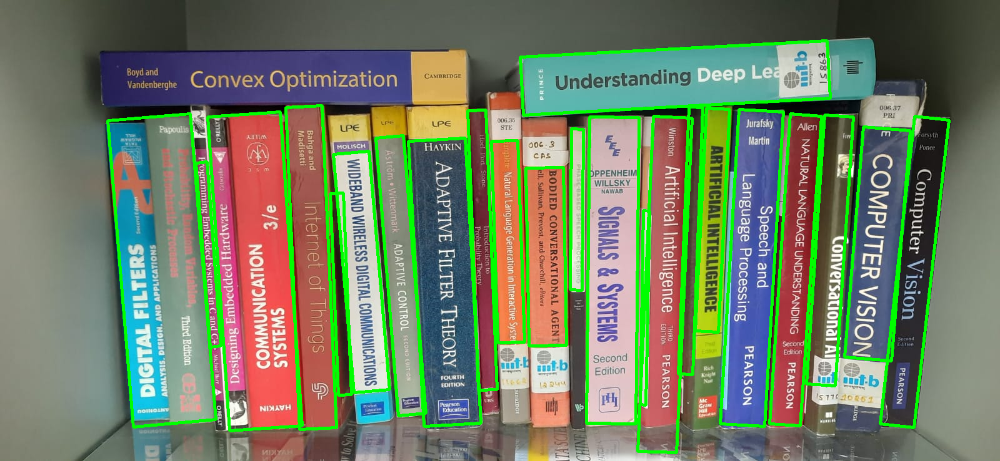

In [21]:
height, width, channels = img.shape

# find the contours
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img_bounding_box_min_area = img.copy()
for i in range(len(contours)):
    cnt = contours[i]

    rect = cv.minAreaRect(cnt)
    box = cv.boxPoints(rect)
    box = np.int0(box)
    w = abs(box[0][0]-box[2][0])
    h = abs(box[0][1]-box[2][1])
    peri = 2*(w+h)
    if(peri>550 and peri< 2000):
        img_bounding_box_min_area = cv.drawContours(img_bounding_box_min_area,[box],0,(0,255,0),3)

cv2_imshow(img_bounding_box_min_area)

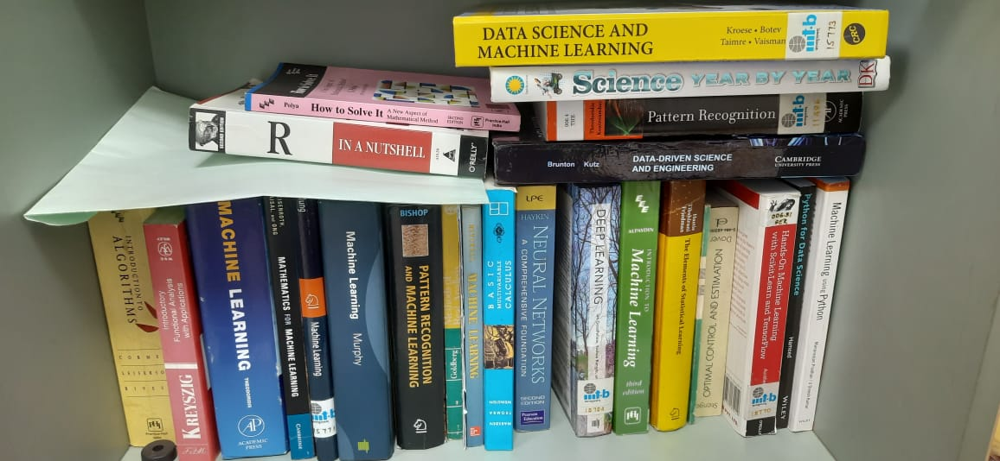

In [22]:
# getting the dataset(csv file) and converting into pandas dataframe
path_link_test = "/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/BookCount_2.jpeg"

# LOAD AN IMAGE USING 'IMREAD'
img_test = cv.imread(path_link_test)

cv2_imshow(img_test)

4/4 [==============================] - 24s 6s/step


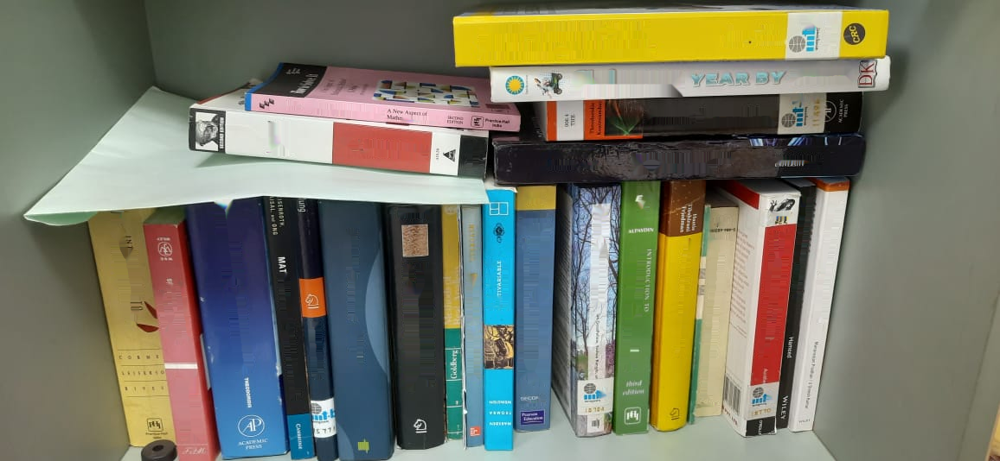

In [23]:
# Example usage
modified_image_test = inpaint_text(path_link_test, pipeline)
cv2_imshow(modified_image_test)

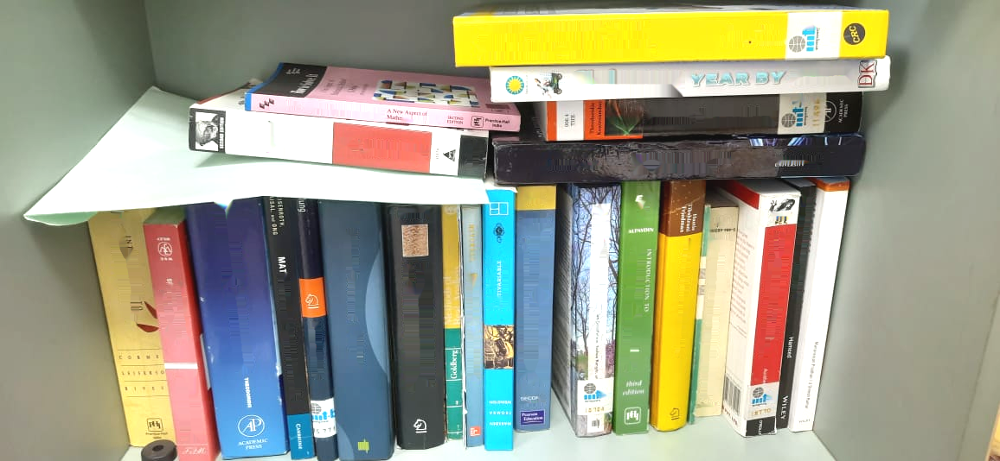

In [24]:
image_new_test = modified_image_test.copy()
# Adjusts the brightness by adding 10 to each pixel value
brightness = 15
# Adjusts the contrast by scaling the pixel values by 2.3
contrast = 1.2
image_new_test = cv2.addWeighted(image_new_test, contrast, np.zeros(image_new_test.shape, image_new_test.dtype), 0, brightness)
cv2_imshow(image_new_test)

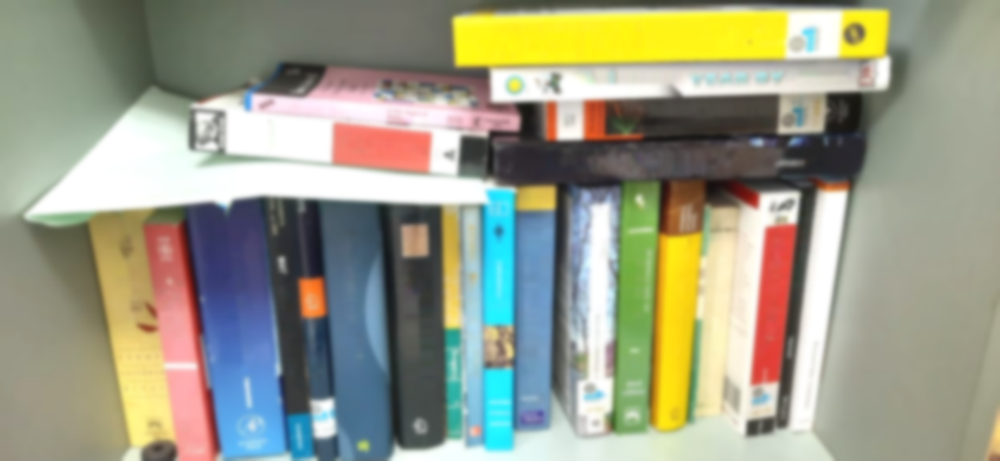

In [26]:
# Blur image with Gaussian Blurring method
blur_img_new_test = cv.GaussianBlur(image_new_test,(15,15),0)

cv2_imshow(blur_img_new_test)

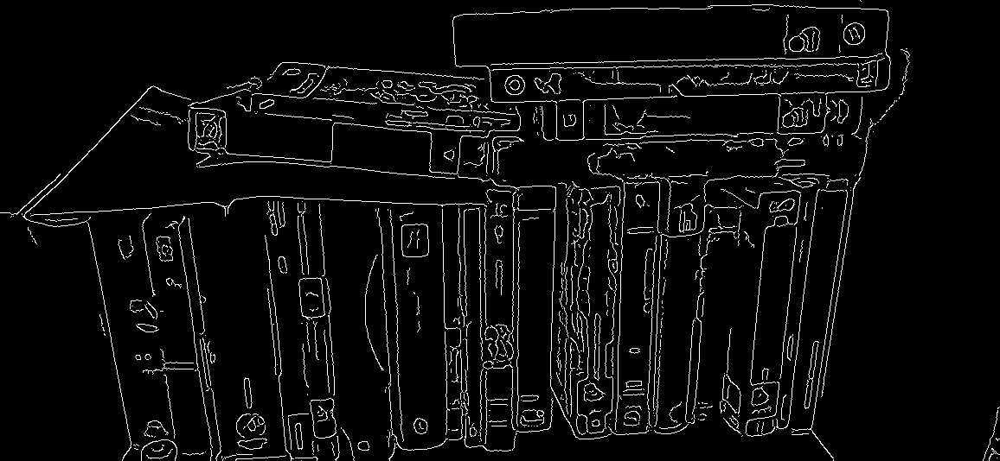

In [27]:
# convert the image to grayscale
gray_canny_test = cv.cvtColor(blur_img_new_test, cv.COLOR_BGR2GRAY)


# Applying Canny edge detection method on gray-scale image
edged_test = cv.Canny(gray_canny_test,35,5)

cv2_imshow(edged_test)

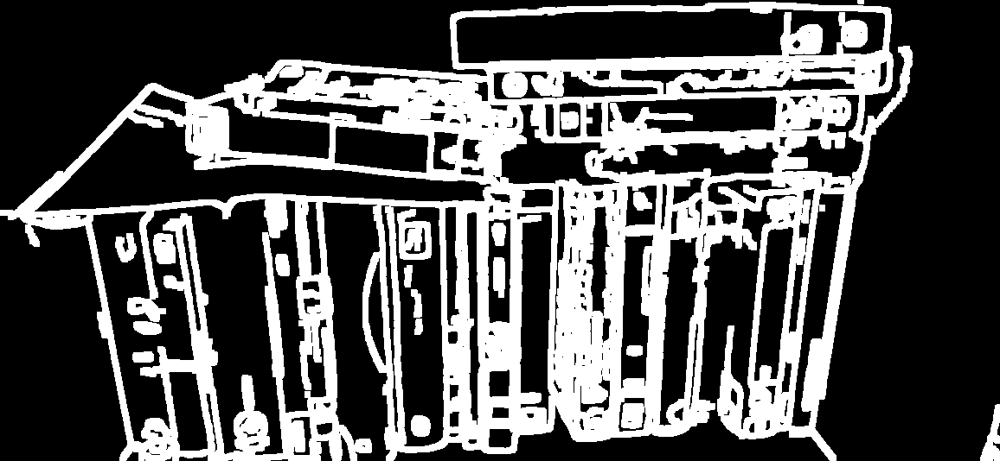

In [28]:
kernel = np.ones((7, 7), np.uint8)

img_dilation_test = cv2.dilate(edged_test, kernel, iterations=1)
cv2_imshow(img_dilation_test)

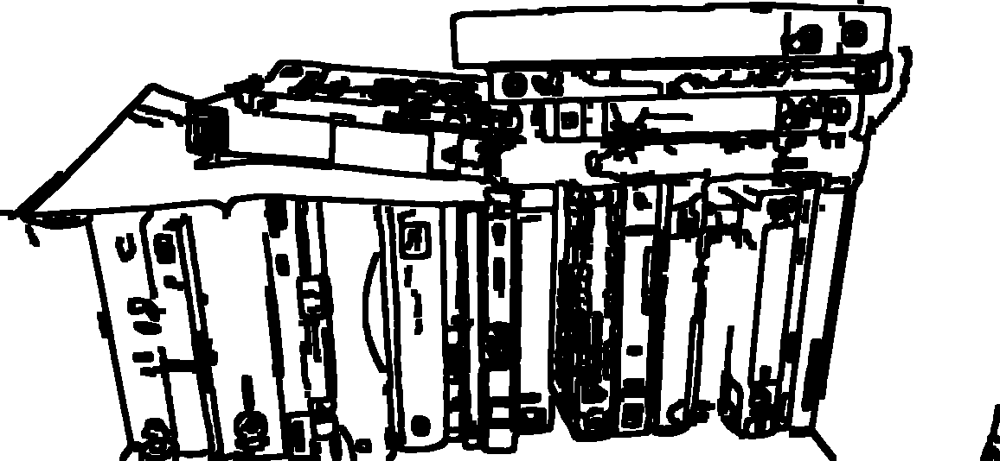

In [29]:
# get the shape of the image
height_test, width_test = img_dilation_test.shape[0], img_dilation_test.shape[1]

reverted_img_test = img_dilation_test.copy()

# Converting all pixels greater than zero to black while black becomes white
for i in range(height_test):
    for j in range(width_test):
        if reverted_img_test[i, j].sum() == 0:
            reverted_img_test[i, j] = 255
        else:
            reverted_img_test[i, j] = 0

cv2_imshow(reverted_img_test)

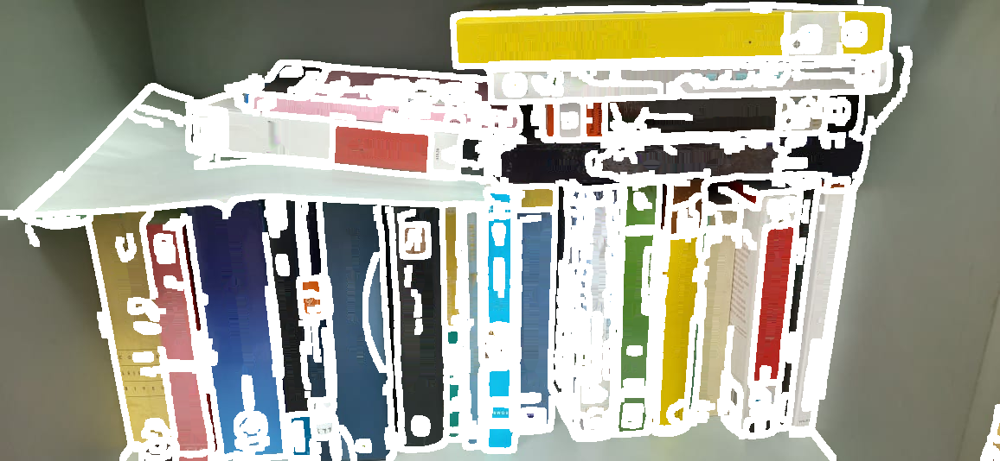

In [30]:
# get the shape of the image
height_test, width_test = img_dilation_test.shape[0], img_dilation_test.shape[1]

reverted_img_test = img_dilation_test.copy()
background_image_test = modified_image_test.copy()
# Converting all pixels greater than zero to black while black becomes white
for i in range(height_test):
    for j in range(width_test):
        if reverted_img_test[i, j].sum() == 0:
            background_image_test[i, j] = modified_image_test[i,j]
        else:
            background_image_test[i, j] = reverted_img_test[i, j]

cv2_imshow(background_image_test)

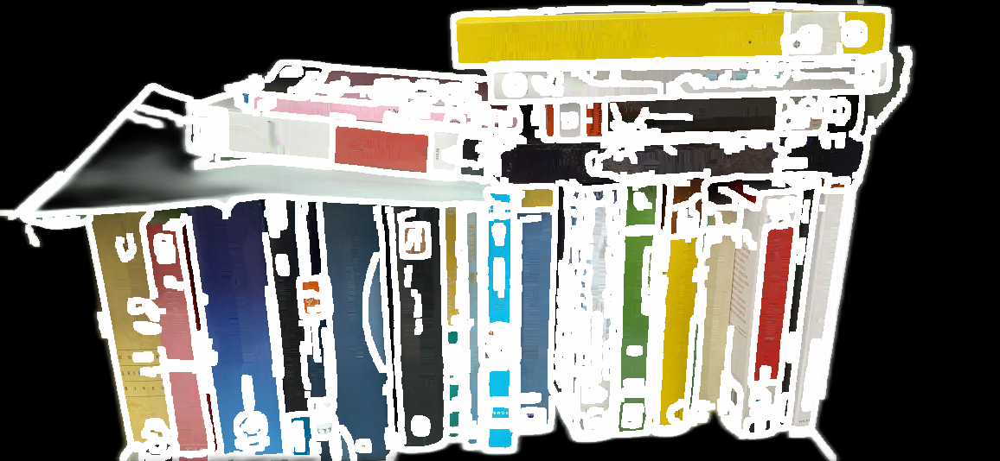

In [31]:
import rembg
from PIL import Image

# Convert the input image to a numpy array
input_array_test = np.array(background_image_test)

# Apply background removal using rembg
output_array_test = rembg.remove(input_array_test)

# Create a PIL Image from the output array
output_image_test = Image.fromarray(output_array_test)

# Convert the PIL image to a NumPy array
numpy_image_test = np.array(output_image_test)

# If the image is in RGBA format (contains an alpha channel), convert it to RGB
if numpy_image_test.shape[-1] == 4:
    numpy_image_test = cv2.cvtColor(numpy_image_test, cv2.COLOR_RGBA2RGB)
cv2_imshow(numpy_image_test)

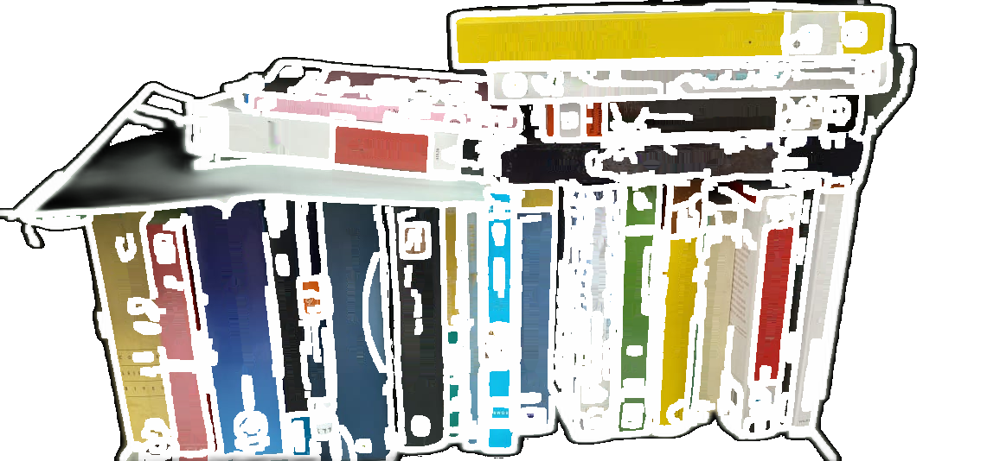

In [32]:
# get the shape of the image
height_test, width_test = numpy_image_test.shape[0], numpy_image_test.shape[1]

rmbg_img_test = numpy_image_test.copy()

# Converting all pixels greater than zero to black while black becomes white
for i in range(height_test):
    for j in range(width_test):
        if rmbg_img_test[i, j].sum() <= 10:
            rmbg_img_test[i, j] = [255, 255, 255]
        # else:
        #     rmbg_img[i, j] = [255, 255, 255]

cv2_imshow(rmbg_img_test)

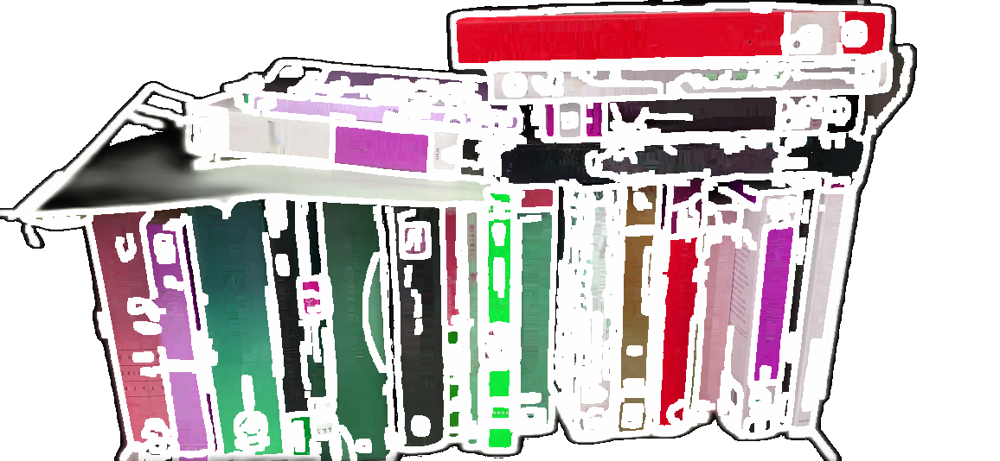

In [33]:
# Convert BGR to HSV
saturation_increased_image_test = cv2.cvtColor(rmbg_img_test, cv2.COLOR_RGB2BGR)
hsv_image_test = cv2.cvtColor(saturation_increased_image_test, cv2.COLOR_BGR2HSV)

# Change the hue value (e.g., shift by 30 degrees)
hue_shift = 30
hsv_image_test[:, :, 0] = (hsv_image_test[:, :, 0] + hue_shift) % 180

# Convert HSV back to BGR
result_image_test = cv2.cvtColor(hsv_image_test, cv2.COLOR_HSV2BGR)
result_image_test = cv2.cvtColor(result_image_test, cv2.COLOR_BGR2RGB)

cv2_imshow(result_image_test)

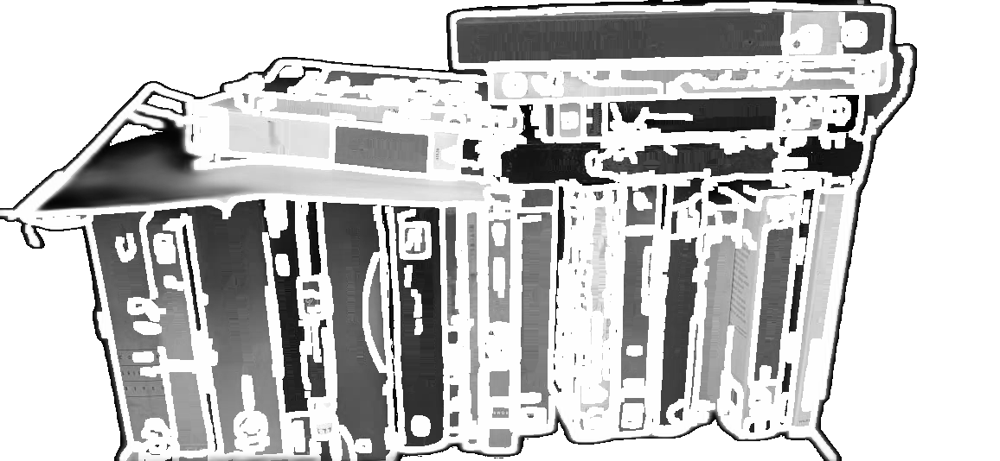

In [34]:
# convert the image to grayscale
# gray_image = cv2.cvtColor(result_image, cv2.COLOR_BGR2GRAY)
gray_image_test = cv2.cvtColor(result_image_test, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image_test)

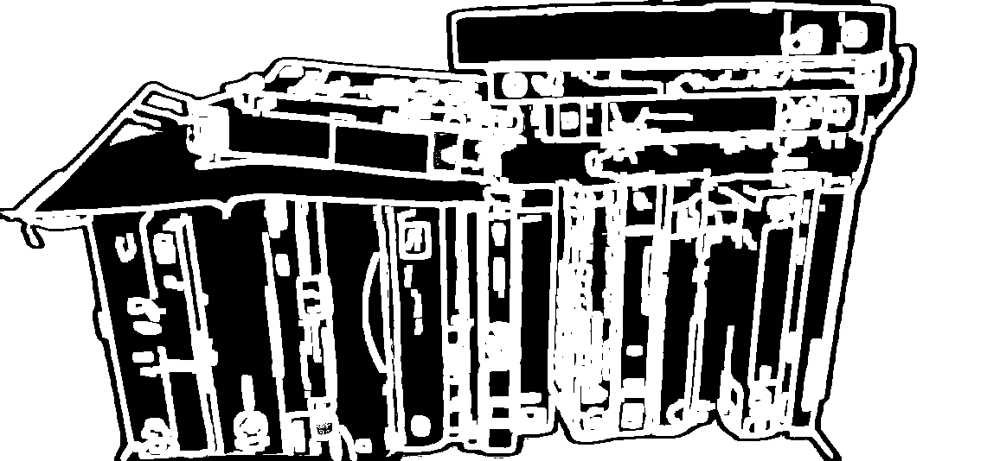

In [35]:
# apply thresholding on the gray image to create a binary image
ret_test, thresh_test = cv.threshold(gray_image_test, 240,255,0)

cv2_imshow(thresh_test)

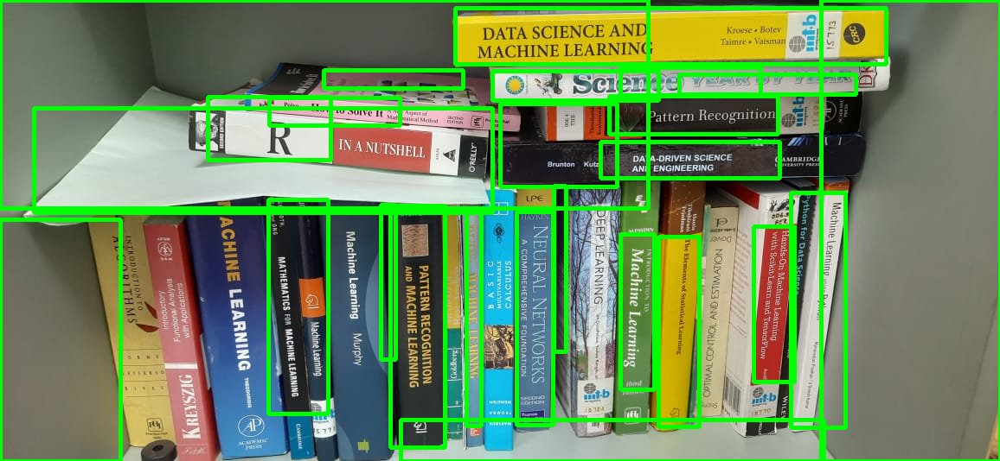

In [38]:
height_test, width_test, channels_test = img_test.shape

# find the contours
contours_test, hierarchy_test = cv.findContours(thresh_test, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img_bounding_box_initial_test = img_test.copy()
for i in range(len(contours_test)):
    cnt = contours_test[i]

    x,y,w,h = cv.boundingRect(cnt)
    # print(x,y,w,h)

    # draw the bounding rectangle
    peri = 2*(w+h)
    if(peri>350 and peri<2000):
        img_bounding_box_initial_test = cv.rectangle(img_bounding_box_initial_test, (x,y),(x+w,y+h),(0,255,0),3)

cv2_imshow(img_bounding_box_initial_test)

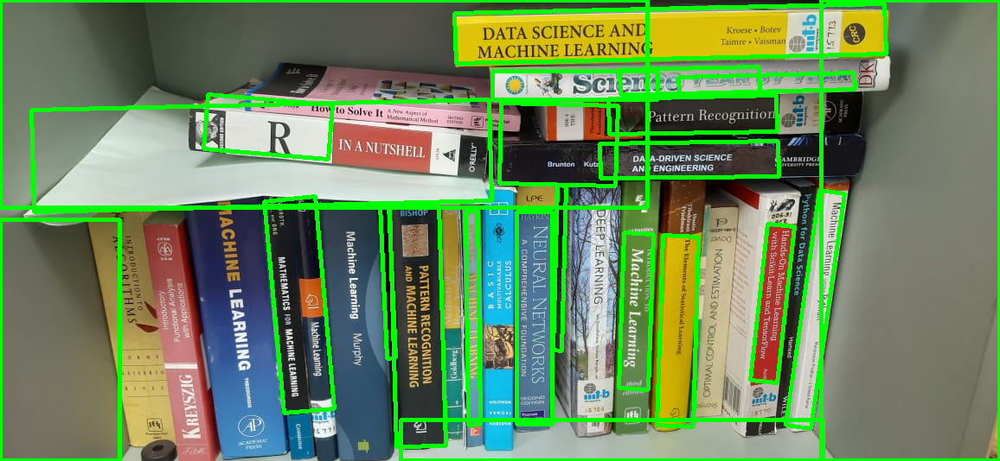

In [39]:
height_test, width_test, channels_test = img_test.shape

# find the contours
contours_test, hierarchy_test = cv.findContours(thresh_test, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

img_bounding_box_min_area_test = img_test.copy()
for i in range(len(contours_test)):
    cnt = contours_test[i]

    rect = cv.minAreaRect(cnt)
    box = cv.boxPoints(rect)
    box = np.int0(box)
    w = abs(box[0][0]-box[2][0])
    h = abs(box[0][1]-box[2][1])
    peri = 2*(w+h)
    if(peri>350 and peri< 2000):
        img_bounding_box_min_area_test = cv.drawContours(img_bounding_box_min_area_test,[box],0,(0,255,0),3)

cv2_imshow(img_bounding_box_min_area_test)

In [42]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/test_result.jpg",img_bounding_box_min_area_test)

True

In [43]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_result.jpg",img_bounding_box_min_area)

True

In [44]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_thresh.jpg",thresh)

True

In [45]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_gray_image.jpg",gray_image)

True

In [46]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_Hue_alter_image.jpg",result_image)

True

In [47]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_remove_bg.jpg",rmbg_img)

True

In [48]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_remove_black_bg.jpg",numpy_image)

True

In [49]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_dilate_superimpose.jpg",background_image)

True

In [50]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_dilate.jpg",img_dilation)

True

In [51]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_canny.jpg",edged)

True

In [52]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_gaussian_blur.jpg",blur_img_new)

True

In [53]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_brightness_contrast.jpg",image_new)

True

In [54]:
cv.imwrite("/content/drive/MyDrive/Colab_Notebooks/IIITB_VR/Assignment_1/train_remove_text.jpg",modified_image)

True